In [84]:
{
  "data": "[{\"EXT_SOURCE_2\":0.0304315707,\"EXT_SOURCE_3\":0.1107962886,\"CODE_GENDER\":0.7209239877,\"PAYMENT_RATE\":-0.2418253653,\"DAYS_EMPLOYED\":0.2833922874,\"PREV_CNT_PAYMENT_MEAN\":-0.2903476431,\"NAME_EDUCATION_TYPE_Highereducation\":1.7625702765,\"INSTAL_DPD_MEAN\":-0.052079095,\"DAYS_BIRTH\":-0.9914858035,\"AMT_ANNUITY\":0.6444642056}]"
}


{'data': '[{"EXT_SOURCE_2":0.0304315707,"EXT_SOURCE_3":0.1107962886,"CODE_GENDER":0.7209239877,"PAYMENT_RATE":-0.2418253653,"DAYS_EMPLOYED":0.2833922874,"PREV_CNT_PAYMENT_MEAN":-0.2903476431,"NAME_EDUCATION_TYPE_Highereducation":1.7625702765,"INSTAL_DPD_MEAN":-0.052079095,"DAYS_BIRTH":-0.9914858035,"AMT_ANNUITY":0.6444642056}]'}

In [1]:
# HOME CREDIT DEFAULT RISK COMPETITION
# Most features are created by applying min, max, mean, sum and var functions to grouped tables. 
# Little feature selection is done and overfitting might be a problem since many features are related.
# The following key ideas were used:
# - Divide or subtract important features to get rates (like annuity and income)
# - In Bureau Data: create specific features for Active credits and Closed credits
# - In Previous Applications: create specific features for Approved and Refused applications
# - Modularity: one function for each table (except bureau_balance and application_test)
# - One-hot encoding for categorical features
# All tables are joined with the application DF using the SK_ID_CURR key (except bureau_balance).
# You can use LightGBM with KFold or Stratified KFold.

# Update 16/06/2018:
# - Added Payment Rate feature
# - Removed index from features
# - Use standard KFold CV (not stratified)

# Importation des libraries

import sys
import functions
#from functions import *
import gc
import time
import re
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
import sklearn
import matplotlib
import matplotlib.pyplot as plt
from contextlib import contextmanager
import mlflow
import mlflow.sklearn
import shap
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, recall_score, f1_score, roc_auc_score, auc, roc_curve
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif # use this for classification tasks
import warnings
%matplotlib inline
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
pwd

'/Users/zeyneperdem/Desktop/ds_prep/p7'

In [3]:
# Les versions des libraries
print("Python: ", sys.version)
print("Pandas: ", pd.__version__)
print("Numpy: ", np.__version__)
print("Seaborn: ", sns.__version__)
print("Matplotlib: ", matplotlib.__version__)
print("Missingno: ", msno.__version__)
print("Sklearn: ", sklearn.__version__)

Python:  3.9.17 (main, Jul  5 2023, 15:35:09) 
[Clang 14.0.6 ]
Pandas:  2.0.3
Numpy:  1.23.5
Seaborn:  0.12.2
Matplotlib:  3.7.2
Missingno:  0.4.2
Sklearn:  1.2.2


In [4]:
# Les options pour visualisations des dataframes
pd.set_option("display.max_columns", None)

## Importation des données

In [5]:
path = "/Users/zeyneperdem/Desktop/ds_prep/p7/"

In [6]:
dataset = pd.read_csv(path + "dataset.csv")
dataset.head(3)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cashloans,NAME_CONTRACT_TYPE_Revolvingloans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Groupofpeople,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,NAME_TYPE_SUITE_Spousepartner,NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Maternityleave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_EDUCATION_TYPE_Secondarysecondaryspecial,NAME_FAMILY_STATUS_Civilmarriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Singlenotmarried,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Coopapartment,NAME_HOUSING_TYPE_Houseapartment,NAME_HOUSING_TYPE_Municipalapartment,NAME_HOUSING_TYPE_Officeapartment,NAME_HOUSING_TYPE_Rentedapartment,NAME_HOUSING_TYPE_Withparents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaningstaff,OCCUPATION_TYPE_Cookingstaff,OCCUPATION_TYPE_Corestaff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HRstaff,OCCUPATION_TYPE_Highskilltechstaff,OCCUPATION_TYPE_ITstaff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_LowskillLaborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicinestaff,OCCUPATION_TYPE_Privateservicestaff,OCCUPATION_TYPE_Realtyagents,OCCUPATION_TYPE_Salesstaff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Securitystaff,OCCUPATION_TYPE_Waitersbarmenstaff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGAN

In [65]:
application_train = pd.read_csv(path + "data_p7/application_train.csv")
application_train.head(3)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

## Exploration Data Analyses pour le fichier "dataset"

In [7]:
functions.info_general(dataset)

************************* * INFORMATIONS GENERALES DE NOTRE DATAFRAME * *************************
----------------------------------------------------------------------------------------------------

Il y a 307507 lignes et 797 colonnes dans notre dataframe.
----------------------------------------------------------------------------------------------------
* On obtiens l'info sur notre dataframe * 
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307507 entries, 0 to 307506
Columns: 797 entries, SK_ID_CURR to CC_COUNT
dtypes: float64(622), int64(175)
memory usage: 1.8 GB
None
----------------------------------------------------------------------------------------------------
* On obtient les informations statistiques sur notre dataframe * 
----------------------------------------------------------------------------------------------------


,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,307507.0,278181.527256,102790.132982,100002.0,189146.5,278203.0,367143.5,456255.0
TARGET,307507.0,0.080730,0.272420,0.0,0.0,0.0,0.0,1.0
CODE_GENDER,307507.0,0.658352,0.474263,0.0,0.0,1.0,1.0,1.0
FLAG_OWN_CAR,307507.0,0.340106,0.473745,0.0,0.0,0.0,1.0,1.0
FLAG_OWN_REALTY,307507.0,0.306331,0.460970,0.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...
CC_NAME_CONTRACT_STATUS_nan_MAX,86905.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
CC_NAME_CONTRACT_STATUS_nan_MEAN,86905.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
CC_NAME_CONTRACT_STATUS_nan_SUM,86905.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
CC_NAME_CONTRACT_STATUS_nan_VAR,86273.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


----------------------------------------------------------------------------------------------------
*On vérifie s'il y a des doublons dans notre dataframe* 
** Il n'y a pas de doublons **
----------------------------------------------------------------------------------------------------
** On vérifie s'il y a des valeurs nulles et on display pourcentage des valeurs nulles par colonne en descendant **
----------------------------------------------------------------------------------------------------
** On a  25.93 % de valeur nulle dans notre dataframe **


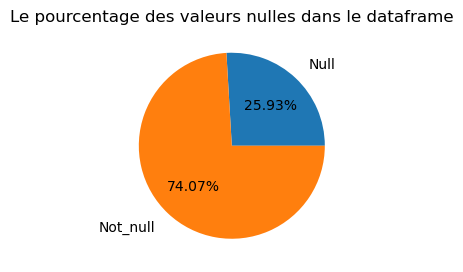

In [8]:
functions.graph_null(dataset)

In [8]:
df_null_dataset = functions.per_null_dataframe(dataset)
# Les colonnes incluent plus de 30% de valeurs manquantes
len(df_null_dataset[df_null_dataset["pourcentage_null"] >30])

253

In [7]:
# On va supprimer ces colonnes 
def remove_columns_with_high_nulls(df, threshold=30):
    """
    Remove columns from DataFrame that have more than a specified percentage of null values.
    
    :param df: DataFrame
    :param threshold: Percentage threshold for null values (default is 30)
    :return: DataFrame with specified columns removed
    """
    per_null = (df.isnull().mean() * 100).round(2)
    columns_to_remove = per_null[per_null > threshold].index
    df_cleaned = df.drop(columns=columns_to_remove)
    return df_cleaned

In [8]:
dataset_removed = remove_columns_with_high_nulls(dataset, threshold=30)
#dataset_removed = dataset_removed.drop("CODE_GENDER", axis=1)
dataset_removed.shape

(307507, 544)

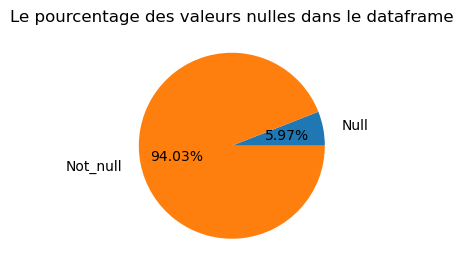

In [9]:
functions.graph_null(dataset_removed)

## On va imputer les valeurs manquantes avec médian de chaque colonne pour chaque colonne 

In [10]:
# On va remplacer les valeurs infinies par NaN avant de procéder à une imputation
dataset_removed.replace([np.inf, -np.inf], np.nan, inplace=True)
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy="median")
data_fillna_median = imputer.fit_transform(dataset_removed)
data_fillna_median = pd.DataFrame(data_fillna_median, columns=dataset_removed.columns)

In [11]:
data_fillna_median.isnull().sum().sum()

0

In [12]:
data_fillna_median.shape

(307507, 544)

In [13]:
data_fillna_median.describe()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cashloans,NAME_CONTRACT_TYPE_Revolvingloans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Groupofpeople,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,NAME_TYPE_SUITE_Spousepartner,NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Maternityleave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_EDUCATION_TYPE_Secondarysecondaryspecial,NAME_FAMILY_STATUS_Civilmarriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Singlenotmarried,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Coopapartment,NAME_HOUSING_TYPE_Houseapartment,NAME_HOUSING_TYPE_Municipalapartment,NAME_HOUSING_TYPE_Officeapartment,NAME_HOUSING_TYPE_Rentedapartment,NAME_HOUSING_TYPE_Withparents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaningstaff,OCCUPATION_TYPE_Cookingstaff,OCCUPATION_TYPE_Corestaff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HRstaff,OCCUPATION_TYPE_Highskilltechstaff,OCCUPATION_TYPE_ITstaff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_LowskillLaborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicinestaff,OCCUPATION_TYPE_Privateservicestaff,OCCUPATION_TYPE_Realtyagents,OCCUPATION_TYPE_Salesstaff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Securitystaff,OCCUPATION_TYPE_Waitersbarmenstaff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_Industrytype5,ORGANIZATION_TYPE_Industrytype6,ORGANIZATION_TYPE_Industrytype7,ORGANIZATION_TYPE_Industrytype8,ORGANIZATION_TYPE_Industrytype9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_LegalServices,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORG

In [14]:
def kdeplot_and_boxplot_by_target(df, target_col, feature_cols, figsize=(12, 5)):
    num_feature_cols = len(feature_cols)
    fig, axes = plt.subplots(
        num_feature_cols, 2, figsize=(figsize[0], figsize[1] * num_feature_cols)
    )

    for i, col in enumerate(feature_cols):
        if num_feature_cols == 1:  # Adjust subplots if only one feature column is provided
            ax_kdeplot = axes[0]
            ax_boxplot = axes[1]
        else:
            ax_kdeplot = axes[i, 0]
            ax_boxplot = axes[i, 1]

        # KDE Plot for clients who didn't pay the loan
        sns.kdeplot(data=df[df[target_col] == 0][col], ax=ax_kdeplot, label="Paid", color='blue')
        ax_kdeplot.set_title("KDE Plot - " + col)
        ax_kdeplot.set_xlabel(col)

        # KDE Plot for clients who paid the loan
        
        sns.kdeplot(data=df[df[target_col] == 1][col], ax=ax_kdeplot, label="Not Paid", color='red')
        # Boxplot for both groups
        sns.boxplot(data=df, x=target_col, y=col, ax=ax_boxplot, palette={1: 'red', 0: 'blue'})
        ax_boxplot.set_title("Box Plot - " + col)
        ax_boxplot.set_xlabel(target_col)
        ax_boxplot.set_ylabel(col)
        
        # Create a separate legend for the box plot
        handles, labels = ax_boxplot.get_legend_handles_labels()
        legend_labels = ["Paid", "Not Paid"]
    
        # Create custom artists for the legend
        custom_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color,
                                    markersize=8, label=label) for color,
                         label in zip(['blue', 'red'], legend_labels)]
    
        #plt.legend(handles=custom_legend, loc='upper right')

        ax_kdeplot.legend()
        ax_boxplot.legend(handles=custom_legend, loc='lower right')
        #plt.legend(handles=custom_legend, loc='lower right')
    plt.tight_layout()
    plt.show()

In [15]:
cols_test = ['DAYS_EMPLOYED', 'DAYS_BIRTH']

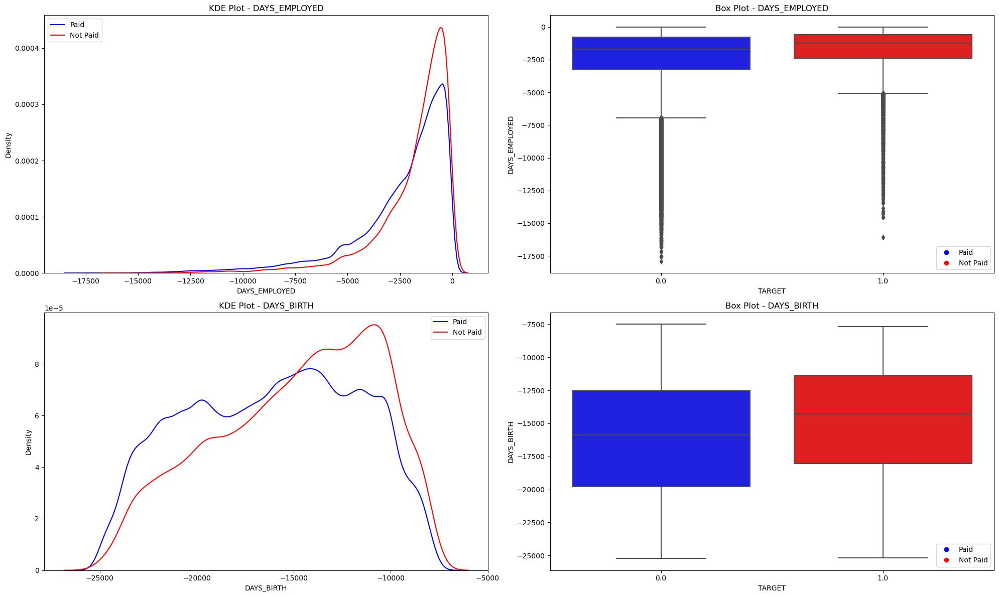

In [19]:
kdeplot_and_boxplot_by_target(dataset_removed, "TARGET", cols_test, figsize=(20, 6))

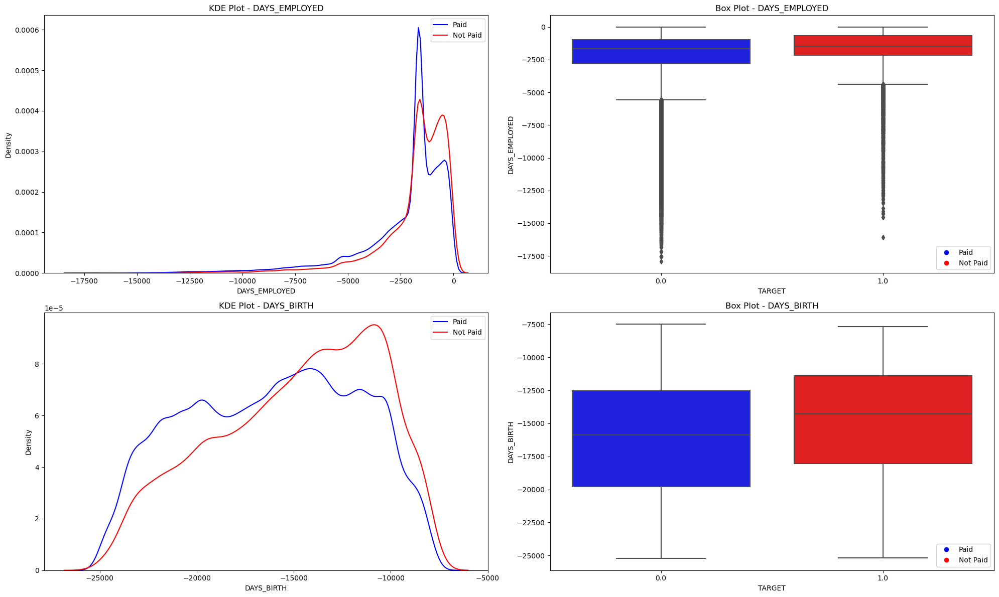

In [20]:
kdeplot_and_boxplot_by_target(data_fillna_median, "TARGET", cols_test, figsize=(20, 6))

# Splitter notre dataset

### On va définir X et y

In [16]:
X = data_fillna_median.drop('TARGET', axis=1).set_index('SK_ID_CURR')
y = data_fillna_median['TARGET']

### Diviser les données en ensembles d'entraînement et de test

In [17]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=0)
X_train = pd.DataFrame(X_train, columns=X.columns, index=X_train.index)
X_test = pd.DataFrame(X_test, columns=X.columns, index=X_test.index)
print(X_train.shape)
print(X_test.shape)

(246005, 542)
(61502, 542)


# Feature Selection

## Remove Low Variance Features

Sklearn provides the VarianceThreshold() function to remove less important features. It uses variance as the ranking criteria. We can use it to remove features that are constant (have a variance of 0, i.e. all rows have the same value) or nearly constant (have a variance that is very low).

In [18]:
# Perform feature selection using a variance threshold
from sklearn.feature_selection import VarianceThreshold

sel = VarianceThreshold(threshold=(0))
sel.fit(X_train)
cols_var = list(X.columns[~sel.get_support()])
print("Removed features:", cols_var)

Removed features: ['FLAG_MOBIL', 'NAME_FAMILY_STATUS_Unknown', 'BURO_CREDIT_ACTIVE_nan_MEAN', 'BURO_CREDIT_CURRENCY_nan_MEAN', 'BURO_CREDIT_TYPE_nan_MEAN', 'PREV_NAME_CONTRACT_TYPE_nan_MEAN', 'PREV_WEEKDAY_APPR_PROCESS_START_nan_MEAN', 'PREV_FLAG_LAST_APPL_PER_CONTRACT_nan_MEAN', 'PREV_NAME_CASH_LOAN_PURPOSE_nan_MEAN', 'PREV_NAME_CONTRACT_STATUS_nan_MEAN', 'PREV_NAME_PAYMENT_TYPE_nan_MEAN', 'PREV_CODE_REJECT_REASON_nan_MEAN', 'PREV_NAME_CLIENT_TYPE_nan_MEAN', 'PREV_NAME_GOODS_CATEGORY_HouseConstruction_MEAN', 'PREV_NAME_GOODS_CATEGORY_nan_MEAN', 'PREV_NAME_PORTFOLIO_nan_MEAN', 'PREV_NAME_PRODUCT_TYPE_nan_MEAN', 'PREV_CHANNEL_TYPE_nan_MEAN', 'PREV_NAME_SELLER_INDUSTRY_nan_MEAN', 'PREV_NAME_YIELD_GROUP_nan_MEAN', 'POS_NAME_CONTRACT_STATUS_nan_MEAN']


In [19]:
len(cols_var)

21

In [20]:
# Transform (remove low variance features)
X_train_var = sel.transform(X_train)
X_test_var = sel.transform(X_test)
X_train_var = pd.DataFrame(X_train_var, columns=X_train.drop(cols_var, axis=1).columns, index=X_train.index)
X_test_var = pd.DataFrame(X_test_var, columns=X_train.drop(cols_var, axis=1).columns, index=X_test.index)
print(X_train_var.shape)
print(X_test_var.shape)

(246005, 521)
(61502, 521)


## Remove Highly Correlated Features

Sklearn provides functions that allow us to compute and visualize correlations between our features. We looked at some of these in the chapter on multicollinearity. Sklearn doesn't provide a specific function to remove highly correlated features, so we need to write some code to do this. Here is a function that finds features that are highly correlated to other features in a dataset:

In [21]:
# Function to list features that are correlated
# Adds the first of the correlated pair only (not both)
def correlatedFeatures(dataset, threshold):
    correlated_columns = set()
    correlations = dataset.corr()
    for i in range(len(correlations)):
        for j in range(i):
            if abs(correlations.iloc[i,j]) > threshold:
                correlated_columns.add(correlations.columns[i])
    return correlated_columns

In [22]:
# Get a set of correlated features, based on threshold correlation of 0.80
cf = correlatedFeatures(X_train_var, 0.80)
cf

{'ACTIVE_AMT_CREDIT_SUM_DEBT_SUM',
 'ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM',
 'ACTIVE_AMT_CREDIT_SUM_MAX',
 'ACTIVE_AMT_CREDIT_SUM_MEAN',
 'ACTIVE_AMT_CREDIT_SUM_OVERDUE_MEAN',
 'ACTIVE_AMT_CREDIT_SUM_SUM',
 'ACTIVE_CNT_CREDIT_PROLONG_SUM',
 'ACTIVE_CREDIT_DAY_OVERDUE_MAX',
 'ACTIVE_CREDIT_DAY_OVERDUE_MEAN',
 'ACTIVE_DAYS_CREDIT_MEAN',
 'AMT_GOODS_PRICE',
 'APPROVED_AMT_ANNUITY_MAX',
 'APPROVED_AMT_ANNUITY_MEAN',
 'APPROVED_AMT_ANNUITY_MIN',
 'APPROVED_AMT_APPLICATION_MAX',
 'APPROVED_AMT_APPLICATION_MEAN',
 'APPROVED_AMT_APPLICATION_MIN',
 'APPROVED_AMT_CREDIT_MAX',
 'APPROVED_AMT_CREDIT_MEAN',
 'APPROVED_AMT_CREDIT_MIN',
 'APPROVED_AMT_DOWN_PAYMENT_MAX',
 'APPROVED_AMT_DOWN_PAYMENT_MEAN',
 'APPROVED_AMT_DOWN_PAYMENT_MIN',
 'APPROVED_AMT_GOODS_PRICE_MAX',
 'APPROVED_AMT_GOODS_PRICE_MEAN',
 'APPROVED_AMT_GOODS_PRICE_MIN',
 'APPROVED_APP_CREDIT_PERC_MAX',
 'APPROVED_APP_CREDIT_PERC_MEAN',
 'APPROVED_APP_CREDIT_PERC_MIN',
 'APPROVED_CNT_PAYMENT_MEAN',
 'APPROVED_DAYS_DECISION_MAX',
 'APPROVED_

In [23]:
len(cf)

112

In [24]:
# Remove the correlated features
X_train_corr = X_train_var.drop(cf, axis=1)
X_test_corr = X_test_var.drop(cf, axis=1)
print(X_train_corr.shape)
print(X_test_corr.shape)

(246005, 409)
(61502, 409)


In [25]:
X_test_corr

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cashloans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Groupofpeople,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,NAME_TYPE_SUITE_Spousepartner,NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Maternityleave,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_FAMILY_STATUS_Civilmarriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Singlenotmarried,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Coopapartment,NAME_HOUSING_TYPE_Houseapartment,NAME_HOUSING_TYPE_Municipalapartment,NAME_HOUSING_TYPE_Officeapartment,NAME_HOUSING_TYPE_Rentedapartment,NAME_HOUSING_TYPE_Withparents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaningstaff,OCCUPATION_TYPE_Cookingstaff,OCCUPATION_TYPE_Corestaff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HRstaff,OCCUPATION_TYPE_Highskilltechstaff,OCCUPATION_TYPE_ITstaff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_LowskillLaborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicinestaff,OCCUPATION_TYPE_Privateservicestaff,OCCUPATION_TYPE_Realtyagents,OCCUPATION_TYPE_Salesstaff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Securitystaff,OCCUPATION_TYPE_Waitersbarmenstaff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_Industrytype5,ORGANIZATION_TYPE_Industrytype6,ORGANIZATION_TYPE_Industrytype7,ORGANIZATION_TYPE_Industrytype8,ORGANIZATION_TYPE_Industrytype9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_LegalServices,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_SecurityMinistries,ORGANIZATION_TYPE_Selfemployed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom

In [31]:
#X_train_corr.to_csv("df_train_api.csv")
#X_test_corr.to_csv("df_test_api.csv")

In [32]:
#pd.read_csv("df_train_api.csv")

In [26]:
cols_train = X_train_corr.columns
cols_test = X_test_corr.columns

## Select Features by Strength of Relationship to Target

Sklearn provides the SelectKBest() function to select a given number of features using a univariate statistical test. The statistical test function looks for the features that have the strongest relationship with the target feature.

In [34]:
# Perform feature selection using a univariate statistical test
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif # use this for classification tasks

kbest = SelectKBest(score_func=f_classif, k=10)
kbest.fit(X_train_corr, y_train)

print("Feature scores", kbest.scores_[:10])
most_corr_target = list(X_train_corr.columns[kbest.get_support()])
print("Selected features:", most_corr_target)

Feature scores [7.71100881e+02 1.05197929e+02 6.98745338e+00 9.16768425e+01
 1.09687587e+00 2.18397752e+02 3.64437643e+01 3.42676177e+02
 1.52977113e+03 9.85909478e+02]
Selected features: ['DAYS_BIRTH', 'DAYS_EMPLOYED', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'BURO_DAYS_CREDIT_MIN', 'BURO_DAYS_CREDIT_UPDATE_MEAN', 'BURO_CREDIT_ACTIVE_Active_MEAN', 'PREV_NAME_CONTRACT_STATUS_Approved_MEAN', 'PREV_NAME_CONTRACT_STATUS_Refused_MEAN', 'PREV_NAME_PRODUCT_TYPE_walkin_MEAN']


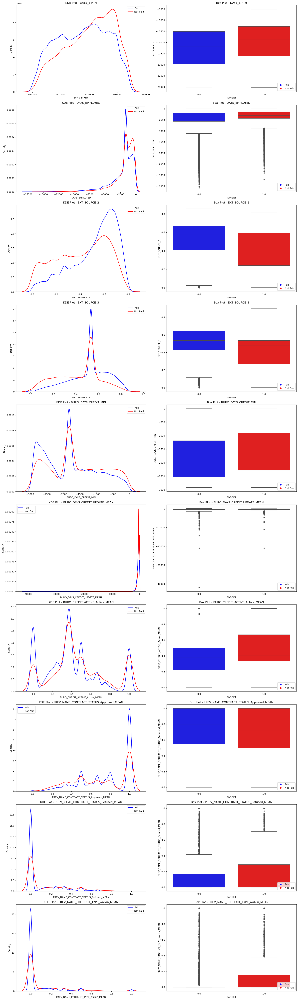

In [35]:
kdeplot_and_boxplot_by_target(data_fillna_median, "TARGET", most_corr_target, figsize=(18, 6))

In [36]:
# Transform (remove features not selected)
# X_train = kbest.transform(X_train)
# X_test = kbest.transform(X_test)
# print(X_train.shape)
# print(X_test.shape)

### On va mettre à l'échelle(scaler) les colonnes

In [27]:
scaler =  StandardScaler()
#scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_corr)
X_test_scaled = scaler.transform(X_test_corr)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=cols_train, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=cols_test, index=X_test.index)
print(X_train_scaled.shape)
print(X_test_scaled.shape)

(246005, 409)
(61502, 409)


In [28]:
X_test_scaled.head(3)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cashloans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Groupofpeople,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,NAME_TYPE_SUITE_Spousepartner,NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Maternityleave,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_FAMILY_STATUS_Civilmarriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Singlenotmarried,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Coopapartment,NAME_HOUSING_TYPE_Houseapartment,NAME_HOUSING_TYPE_Municipalapartment,NAME_HOUSING_TYPE_Officeapartment,NAME_HOUSING_TYPE_Rentedapartment,NAME_HOUSING_TYPE_Withparents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaningstaff,OCCUPATION_TYPE_Cookingstaff,OCCUPATION_TYPE_Corestaff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HRstaff,OCCUPATION_TYPE_Highskilltechstaff,OCCUPATION_TYPE_ITstaff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_LowskillLaborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicinestaff,OCCUPATION_TYPE_Privateservicestaff,OCCUPATION_TYPE_Realtyagents,OCCUPATION_TYPE_Salesstaff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Securitystaff,OCCUPATION_TYPE_Waitersbarmenstaff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_Industrytype5,ORGANIZATION_TYPE_Industrytype6,ORGANIZATION_TYPE_Industrytype7,ORGANIZATION_TYPE_Industrytype8,ORGANIZATION_TYPE_Industrytype9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_LegalServices,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_SecurityMinistries,ORGANIZATION_TYPE_Selfemployed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom

In [38]:
#X_test_small.to_csv("X_test_small.csv", index=False)

In [39]:
#X_test_small = pd.read_csv("X_test_small.csv")
#X_test_small

,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cashloans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Groupofpeople,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,NAME_TYPE_SUITE_Spousepartner,NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Maternityleave,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_FAMILY_STATUS_Civilmarriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Singlenotmarried,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Coopapartment,NAME_HOUSING_TYPE_Houseapartment,NAME_HOUSING_TYPE_Municipalapartment,NAME_HOUSING_TYPE_Officeapartment,NAME_HOUSING_TYPE_Rentedapartment,NAME_HOUSING_TYPE_Withparents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaningstaff,OCCUPATION_TYPE_Cookingstaff,OCCUPATION_TYPE_Corestaff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HRstaff,OCCUPATION_TYPE_Highskilltechstaff,OCCUPATION_TYPE_ITstaff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_LowskillLaborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicinestaff,OCCUPATION_TYPE_Privateservicestaff,OCCUPATION_TYPE_Realtyagents,OCCUPATION_TYPE_Salesstaff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Securitystaff,OCCUPATION_TYPE_Waitersbarmenstaff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_Industrytype5,ORGANIZATION_TYPE_Industrytype6,ORGANIZATION_TYPE_Industrytype7,ORGANIZATION_TYPE_Industrytype8,ORGANIZATION_TYPE_Industrytype9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_LegalServices,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_SecurityMinistries,ORGANIZATION_TYPE_Selfemployed,ORGANIZATION_TYPE_Services,ORGANIZATION_T

# Equilibrage

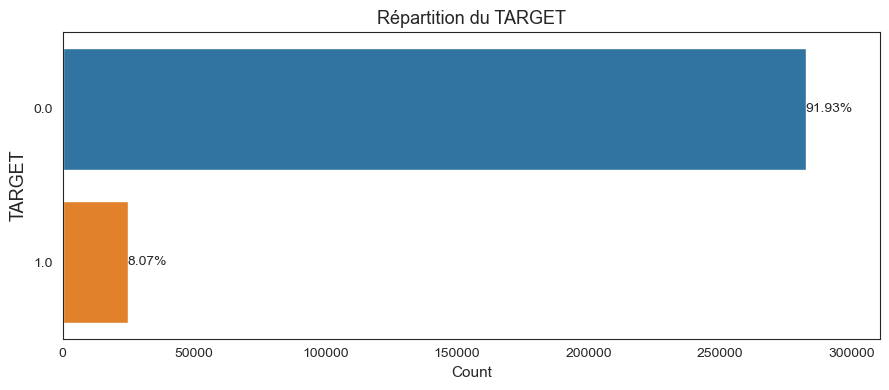

In [29]:
plt.style.use('default')
functions.countplot(data_fillna_median, "TARGET", figsize=(9, 4))

In [29]:
# Under sampling
undersample = RandomUnderSampler(sampling_strategy="majority", random_state=42)
X_unders, y_unders = undersample.fit_resample(X_train_scaled, y_train)
print("Before using RandomUnderSampler:", Counter(y_train))
print("Under sampled dataset shape", Counter(y_unders))

# Over sampling
oversample = SMOTE(random_state=42)
X_overs, y_overs = oversample.fit_resample(X_train_scaled, y_train)
print("Before using SMOTE:", Counter(y_train))
print("Over sampled dataset shape", Counter(y_overs))

Before using RandomUnderSampler: Counter({0.0: 226145, 1.0: 19860})
Under sampled dataset shape Counter({0.0: 19860, 1.0: 19860})
Before using SMOTE: Counter({0.0: 226145, 1.0: 19860})
Over sampled dataset shape Counter({0.0: 226145, 1.0: 226145})


# Modelisation

In [30]:
def fonction_metier(y_test, y_pred):
   
    
    coeff_tp = 0      # Vrais positifs
    coeff_fp = -1       # Faux positifs 
    coeff_fn = -10     # Faux négatifs 
    coeff_tn = 1       # Vrais négatifs
    
    (tn, fp, fn, tp) = metrics.confusion_matrix(y_test, y_pred).ravel()
    total = (coeff_tn*tn + coeff_fp*fp + coeff_fn*fn + coeff_tp*tp)

    #calcul du gain maximal que peut avoir la banque quand il n'y a pas de perte d'argent.
    #C'est à dire que le modèle ne détecte que TN et les TP.
    max_gain = (tn + fp)*coeff_tn + (tp + fn)*coeff_tp

    #calcul du gain minimal (perte) que peut avoir la banque quand il n'y a pas de gain d'argent.
    #C'est à dire que le modèle ne détecte que FN et les FP.
    min_gain = (tn + fp)*coeff_fp + (tp + fn)*coeff_fn

    #normalisation min-max feature scalling : score= (tot-min)/(max-min) 
    #https://en.wikipedia.org/wiki/Normalization_(statistics) 
    gain = (total - min_gain)/(max_gain - min_gain)
    
    #gain = (TP*TP_coeff + TN*TN_coeff + FP*FP_coeff + FN*FN_coeff)/(TN + FP + FN + TP)
    
    return gain

In [31]:
def conf_matrix_roc_curve(y_test, y_pred, y_pred_proba, figsize):
    '''Function for plotting Confusion Matrix and ROC Curve.'''
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Confusion Matrix
    ax1 = axes[0]
    ax1.set_title('Confusion Matrix')
    cf_matrix = confusion_matrix(y_test, y_pred)
    group_names = ['TN', 'FP', 'FN', 'TP']
    group_counts = [f"{value:0.0f}" for value in cf_matrix.flatten()]
    group_percentages = [f"{value:.2%}" for value in cf_matrix.flatten() / np.sum(cf_matrix)]
    
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues', ax=ax1, annot_kws={"size": 18})
    ax1.set_ylabel('True Label', fontsize=18)  # Increase font size for ylabel
    ax1.set_xlabel('Predicted Label', fontsize=18)  # Increase font size for xlabel
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')

    # ROC Curve
    ax2 = axes[1]
    ax2.set_title('ROC Curve')
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)
    ax2.plot(fpr, tpr, color='steelblue', linewidth=5, label=f'AUC = {auc:.2f}', markersize=18)
    ax2.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.legend()
    ax2.set_xlabel('False Positive Rate', fontsize=18)  # Increase font size for xlabel
    ax2.set_ylabel('True Positive Rate', fontsize=18)  # Increase font size for ylabel
    ax2.legend(fontsize=18)  # Increase font size for legend
    plt.tight_layout()
    plt.show()

    return cf_matrix

In [32]:
from sklearn.metrics import make_scorer

cost_scorer = make_scorer(fonction_metier, greater_is_better=True)

In [33]:
def evaluation_score(model, X_train, y_train, X_test, y_test, model_name, figsize):
    '''
    Calculate, display, and save different metrics.
    
    :param model: The machine learning model to evaluate.
    :param X_train: Training data.
    :param y_train: Target labels for training data.
    :param X_test: Testing data.
    :param y_test: True labels for testing data.
    :param figsize: Tuple specifying the figure size for ROC curve.
    :param model_name: Name of the model (for result DataFrame).
    :return: A DataFrame with metrics.
    '''
    start_time = time.time()
    model.fit(X_train, y_train)
    execution_time = time.time() - start_time
    execution_time = round(execution_time,3)
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    metier = fonction_metier(y_test, y_pred).round(2)
    accuracy = metrics.accuracy_score(y_test, y_pred).round(2)
    precision = metrics.precision_score(y_test, y_pred).round(2)
    recall = metrics.recall_score(y_test, y_pred).round(2)
    f1_score = metrics.f1_score(y_test, y_pred).round(2)
    auc_score = metrics.roc_auc_score(y_test, y_pred_proba).round(2)
    
    # Display classification report
    print(classification_report(y_test, y_pred))
    
    # Display confusion matrix and ROC curve
    conf_matrix_roc_curve(y_test, y_pred, y_pred_proba, figsize)
    
    # Create a DataFrame with rounded metrics
    results = pd.DataFrame({'model': [model_name],
                            'accuracy': [accuracy],
                            'precision': [precision],
                            'recall': [recall],
                            'f1_score': [f1_score],
                            'roc_auc_score': [auc_score],
                            'custom_score': [metier],
                            'execution_time': [execution_time]})
    display(results)
    
    return results, precision, recall, f1_score, auc_score, metier

In [34]:
mlflow.set_tracking_uri("/Users/zeyneperdem/Desktop/ds_prep/p7/mlruns")

In [35]:
tracking_uri = mlflow.get_tracking_uri()

In [36]:
tracking_uri

'/Users/zeyneperdem/Desktop/ds_prep/p7/mlruns'

In [37]:
from mlflow.models.signature import infer_signature

In [38]:
def mlfow_track(exp_name, model, X_train, y_train, X_test, y_test, model_name, figsize):
    model = model
    signature = infer_signature(X_train, y_train)
    plt.style.use('fivethirtyeight')
    mlflow.set_experiment(exp_name)
    mlflow.sklearn.autolog()
    mlflow.lightgbm.autolog()
    with mlflow.start_run(run_name=exp_name):
        model.fit(X_train, y_train)
        results, precision, recall, f1_score, auc_score,\
        metier = evaluation_score(model, X_train, y_train, X_test, y_test, model_name, figsize) 
        #mlflow.log_param("class_weight", class_weight)
        #mlflow.log_param("max_iter", max_iter)
        mlflow.log_metric("custom_score", metier)
        mlflow.log_metric("precision", precision)
        mlflow.log_metric("recall", recall)
        mlflow.log_metric("f1_score", f1_score)
        mlflow.log_metric("rocauc", auc_score)
        mlflow.sklearn.log_model(model, "model", registered_model_name=model_name, signature=signature)
        mlflow.lightgbm.log_model(model, "model", registered_model_name=model_name, signature=signature)
    return model, results

# Logistic Regression

## Avec data origine

2023/09/21 13:59:16 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/21 13:59:33 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56537
         1.0       0.51      0.02      0.04      4965

    accuracy                           0.92     61502
   macro avg       0.71      0.51      0.50     61502
weighted avg       0.89      0.92      0.88     61502



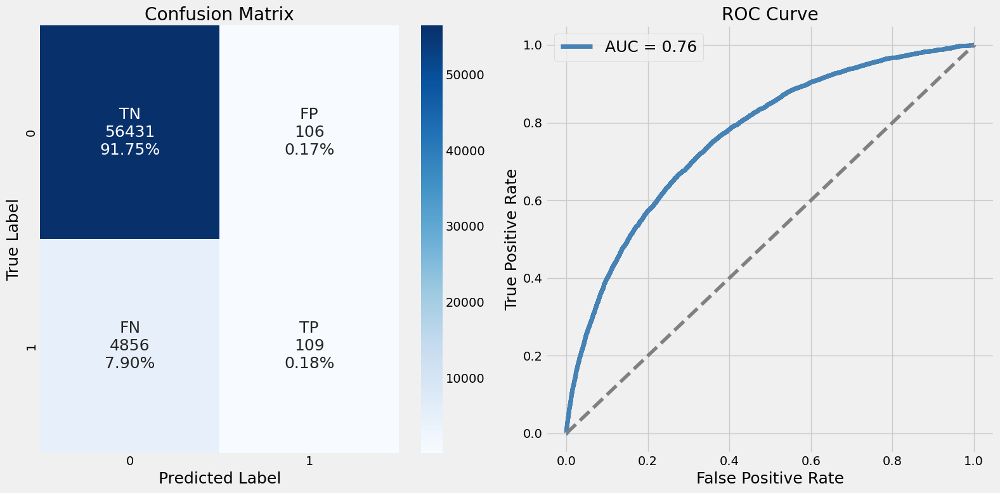

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lr_origine,0.92,0.51,0.02,0.04,0.76,0.7,16.391


Registered model 'lr_origine' already exists. Creating a new version of this model...
2023/09/21 13:59:39 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lr_origine, version 5
Created version '5' of model 'lr_origine'.
Registered model 'lr_origine' already exists. Creating a new version of this model...
2023/09/21 13:59:40 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lr_origine, version 6
Created version '6' of model 'lr_origine'.


In [41]:
model = LogisticRegression()
lr_origine, results_lr_origine = mlfow_track("lr_origine", model,
                             X_train_scaled, y_train, X_test_scaled, y_test, "lr_origine", (16,8))

# Undersampled

2023/09/21 14:04:31 INFO mlflow.tracking.fluent: Experiment with name 'lr_unders' does not exist. Creating a new experiment.
2023/09/21 14:04:35 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/21 14:04:39 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.96      0.70      0.81     56537
         1.0       0.17      0.69      0.27      4965

    accuracy                           0.70     61502
   macro avg       0.56      0.69      0.54     61502
weighted avg       0.90      0.70      0.76     61502



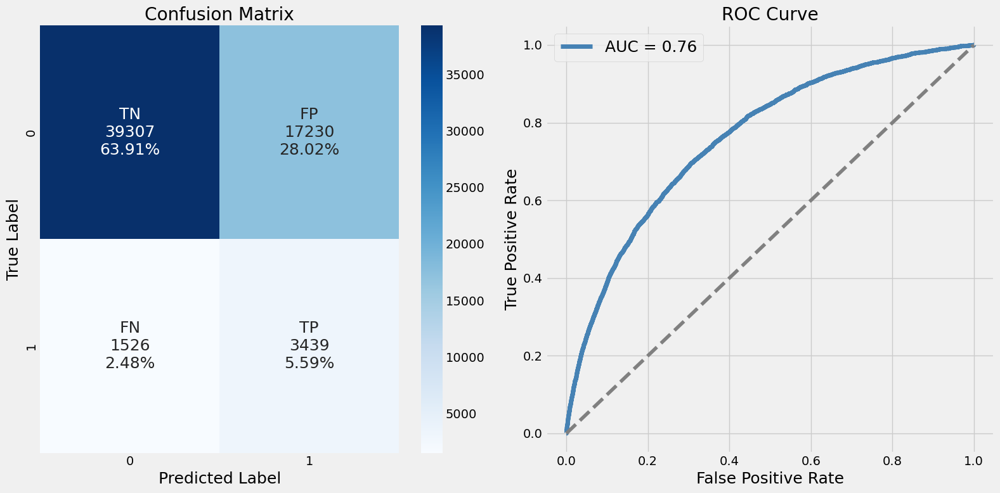

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lr_unders,0.7,0.17,0.69,0.27,0.76,0.69,4.051


Registered model 'lr_unders' already exists. Creating a new version of this model...
2023/09/21 14:04:45 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lr_unders, version 3
Created version '3' of model 'lr_unders'.
Registered model 'lr_unders' already exists. Creating a new version of this model...
2023/09/21 14:04:46 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lr_unders, version 4
Created version '4' of model 'lr_unders'.


In [42]:
model = LogisticRegression()
lr_unders, results_lr_unders = mlfow_track("lr_unders", model,
                             X_unders, y_unders, X_test_scaled, y_test, "lr_unders", (16,8))

In [43]:
lr_unders

LogisticRegression()

In [44]:
results_lr_unders

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lr_unders,0.7,0.17,0.69,0.27,0.76,0.69,4.051


# Oversampled

              precision    recall  f1-score   support

         0.0       0.96      0.72      0.82     56537
         1.0       0.17      0.65      0.26      4965

    accuracy                           0.71     61502
   macro avg       0.56      0.68      0.54     61502
weighted avg       0.89      0.71      0.77     61502



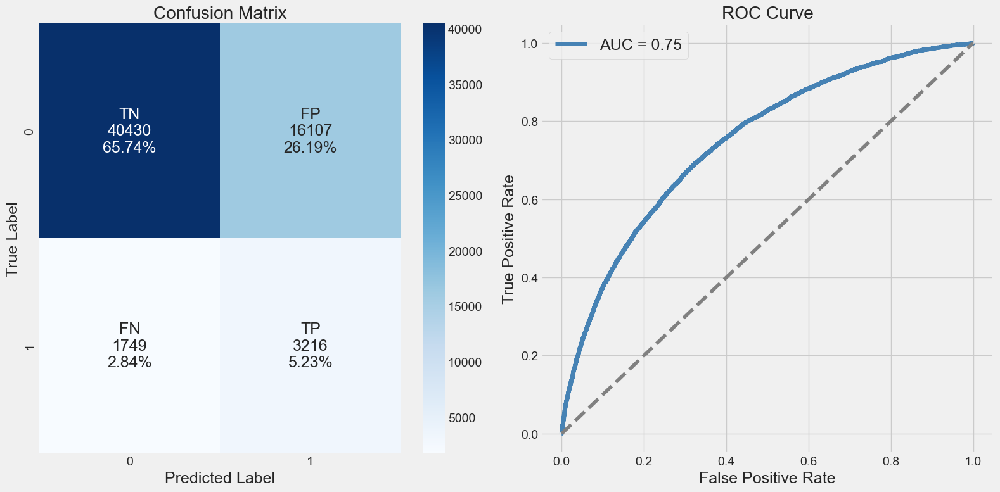

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lr_overs,0.71,0.17,0.65,0.26,0.75,0.69,34.034


In [50]:
model = LogisticRegression()
lr_overs, results_lr_overs = mlfow_track("lr_overs", model,
                             X_overs, y_overs, X_test_scaled, y_test, "lr_overs", (16,8))

# Class weigth balanced

2023/09/14 15:43:30 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/14 15:43:47 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.96      0.70      0.81     56537
         1.0       0.17      0.69      0.27      4965

    accuracy                           0.70     61502
   macro avg       0.57      0.70      0.54     61502
weighted avg       0.90      0.70      0.77     61502



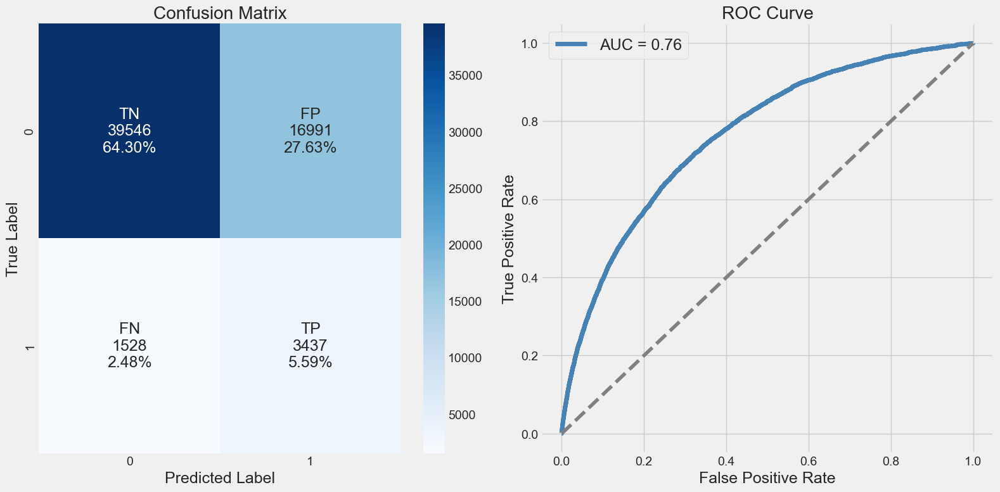

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lr_balanced,0.7,0.17,0.69,0.27,0.76,0.7,17.184


In [51]:
model = LogisticRegression(class_weight="balanced")
lr_balanced, results_lr_balanced = mlfow_track("lr_balanced", model,
                             X_train_scaled, y_train, X_test_scaled, y_test, "lr_balanced", (16,8))

## Comparaison des résultas Logistic Regression

In [52]:
comp_lr = pd.concat([results_lr_origine, results_lr_unders, results_lr_overs, results_lr_balanced], axis=0)
comp_lr

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lr_origine,0.92,0.51,0.02,0.04,0.76,0.70,17.830
0,lr_unders,0.70,0.17,0.69,0.27,0.76,0.69,4.066
0,lr_overs,0.71,0.17,0.65,0.26,0.75,0.69,34.034
0,lr_balanced,0.70,0.17,0.69,0.27,0.76,0.70,17.184


# Random Forest

# Data origine

2023/09/14 15:46:39 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/14 16:04:37 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56537
         1.0       0.78      0.00      0.00      4965

    accuracy                           0.92     61502
   macro avg       0.85      0.50      0.48     61502
weighted avg       0.91      0.92      0.88     61502



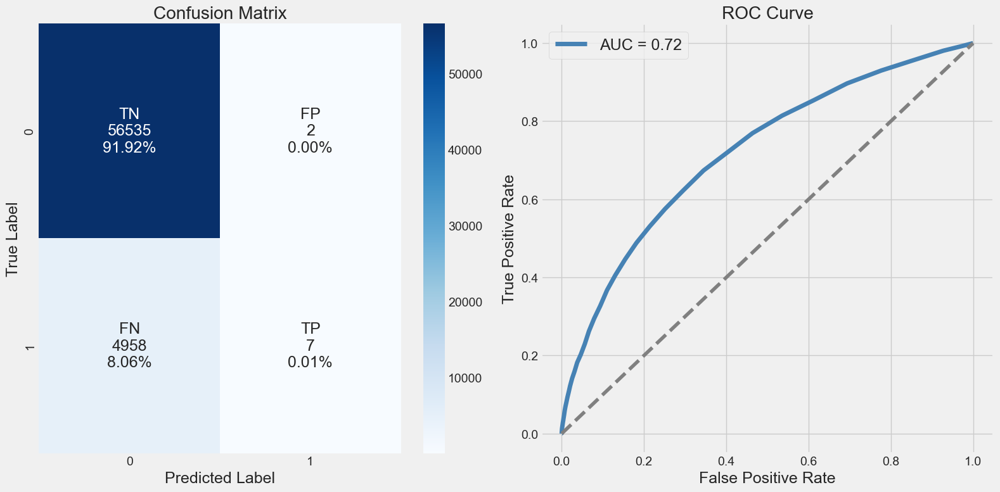

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,rf_origine,0.92,0.78,0.0,0.0,0.72,0.7,1077.782


In [53]:
model = RandomForestClassifier(random_state=42)
rf_origine, results_rf_origine = mlfow_track("rf_origine", model,
                             X_train_scaled, y_train, X_test_scaled, y_test, "rf_origine", (16,8))

# Undersampled

2023/09/14 16:05:03 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/14 16:05:23 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.96      0.69      0.81     56537
         1.0       0.16      0.68      0.26      4965

    accuracy                           0.69     61502
   macro avg       0.56      0.69      0.53     61502
weighted avg       0.90      0.69      0.76     61502



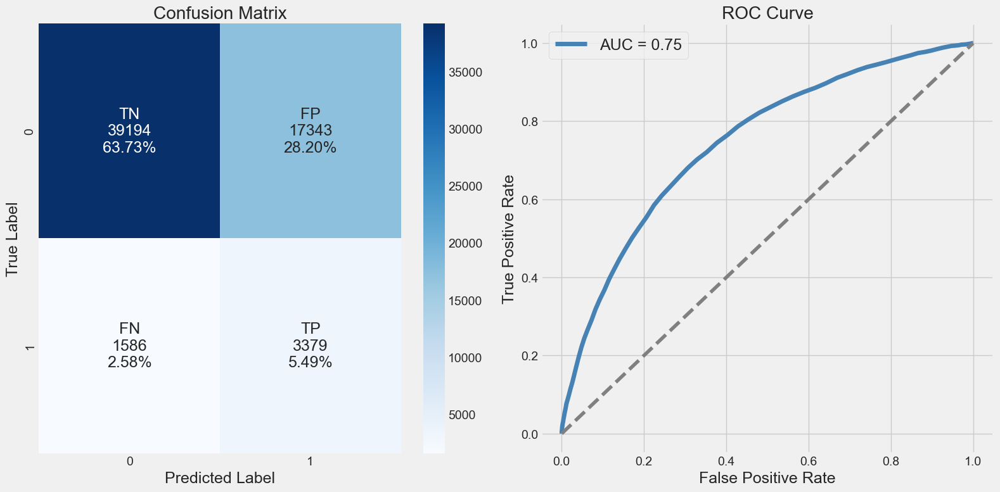

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,rf_unders,0.69,0.16,0.68,0.26,0.75,0.69,19.67


In [54]:
model = RandomForestClassifier(random_state=42)
rf_unders, results_rf_unders = mlfow_track("rf_unders", model,
                             X_unders, y_unders, X_test_scaled, y_test, "rf_unders", (16,8))

## Oversampled

              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56537
         1.0       0.33      0.02      0.04      4965

    accuracy                           0.92     61502
   macro avg       0.63      0.51      0.50     61502
weighted avg       0.87      0.92      0.88     61502



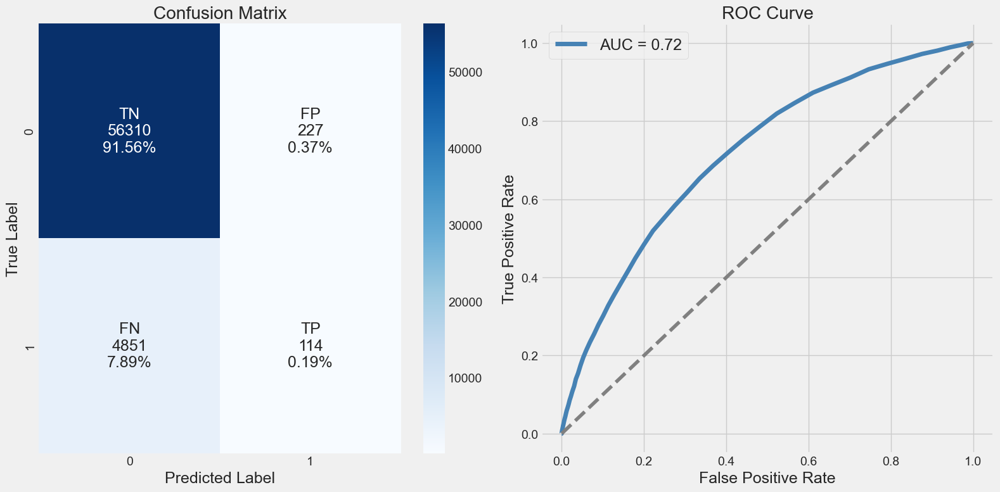

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,rf_overs,0.92,0.33,0.02,0.04,0.72,0.7,317.119


In [55]:
model = RandomForestClassifier(random_state=42)
rf_overs, results_rf_overs = mlfow_track("rf_overs", model,
                             X_overs, y_overs, X_test_scaled, y_test, "rf_overs", (16,8))

# Class weigth balanced

2023/09/14 16:18:22 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/14 16:20:32 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56537
         1.0       0.62      0.00      0.00      4965

    accuracy                           0.92     61502
   macro avg       0.77      0.50      0.48     61502
weighted avg       0.90      0.92      0.88     61502



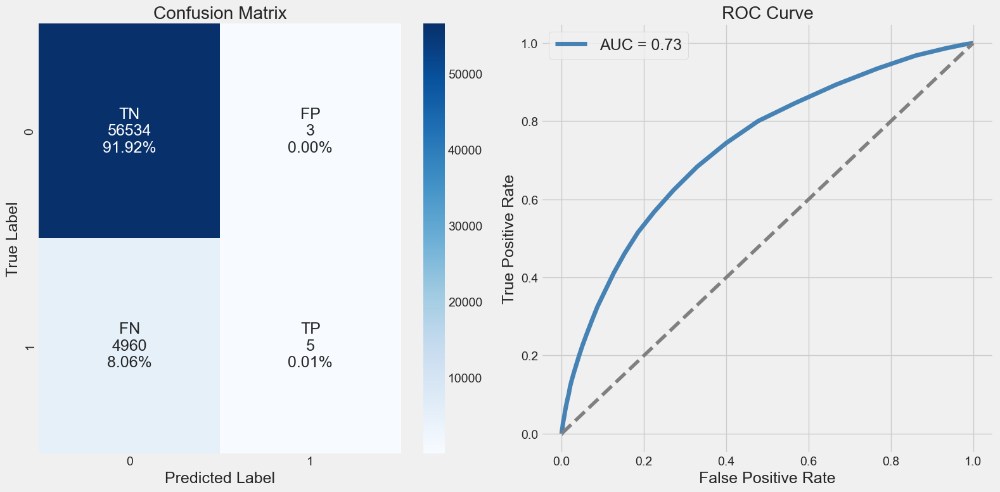

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,rf_balanced,0.92,0.62,0.0,0.0,0.73,0.7,129.976


In [56]:
model = RandomForestClassifier(class_weight="balanced", random_state=42)
rf_balanced, results_rf_balanced = mlfow_track("rf_balanced", model,
                             X_train_scaled, y_train, X_test_scaled, y_test, "rf_balanced", (16,8))

## Comparaison des résultas Random Forest

In [57]:
comp_rf = pd.concat([results_rf_origine, results_rf_unders, results_rf_overs, results_rf_balanced], axis=0)
comp_rf

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,rf_origine,0.92,0.78,0.00,0.00,0.72,0.70,1077.782
0,rf_unders,0.69,0.16,0.68,0.26,0.75,0.69,19.670
0,rf_overs,0.92,0.33,0.02,0.04,0.72,0.70,317.119
0,rf_balanced,0.92,0.62,0.00,0.00,0.73,0.70,129.976


# Lightgbm

# Data origine

              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56537
         1.0       0.53      0.03      0.06      4965

    accuracy                           0.92     61502
   macro avg       0.73      0.51      0.51     61502
weighted avg       0.89      0.92      0.89     61502



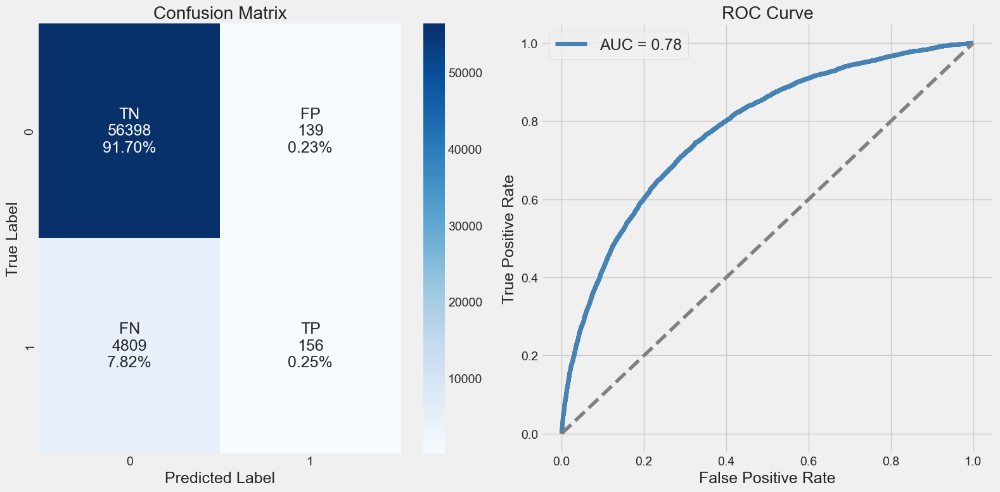

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_origine,0.92,0.53,0.03,0.06,0.78,0.7,4.993


In [58]:
model = LGBMClassifier(random_state=42)
lgbm_origine, results_lgbm_origine = mlfow_track("lgbm_origine", model,
                             X_train_scaled, y_train, X_test_scaled, y_test, "lgbm_origine", (16,8))

# Undersampled

              precision    recall  f1-score   support

         0.0       0.96      0.70      0.81     56537
         1.0       0.17      0.70      0.28      4965

    accuracy                           0.70     61502
   macro avg       0.57      0.70      0.54     61502
weighted avg       0.90      0.70      0.77     61502



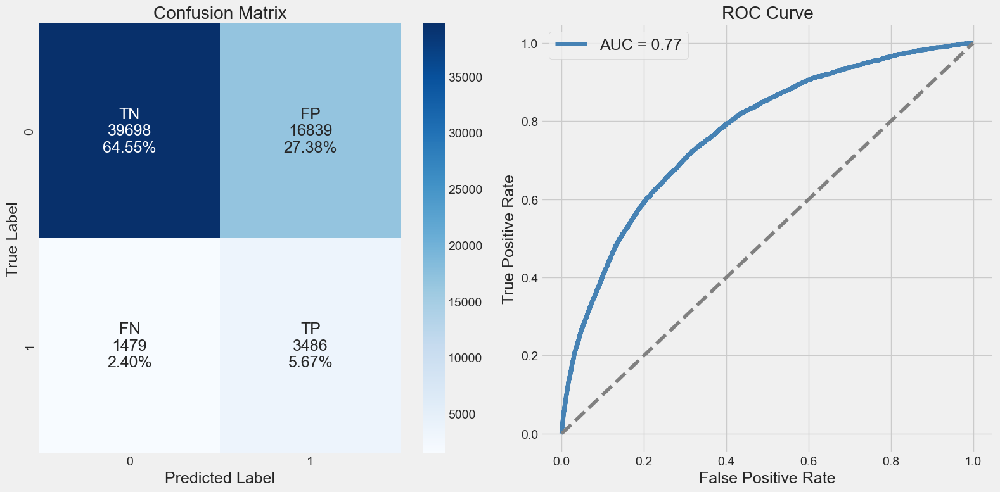

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_unders,0.7,0.17,0.7,0.28,0.77,0.7,1.231


In [59]:
model = LGBMClassifier(random_state=42)
lgbm_unders, results_lgbm_unders = mlfow_track("lgbm_unders", model,
                             X_unders, y_unders, X_test_scaled, y_test, "lgbm_unders", (16,8))

## Oversampled

              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56537
         1.0       0.53      0.03      0.05      4965

    accuracy                           0.92     61502
   macro avg       0.72      0.51      0.50     61502
weighted avg       0.89      0.92      0.88     61502



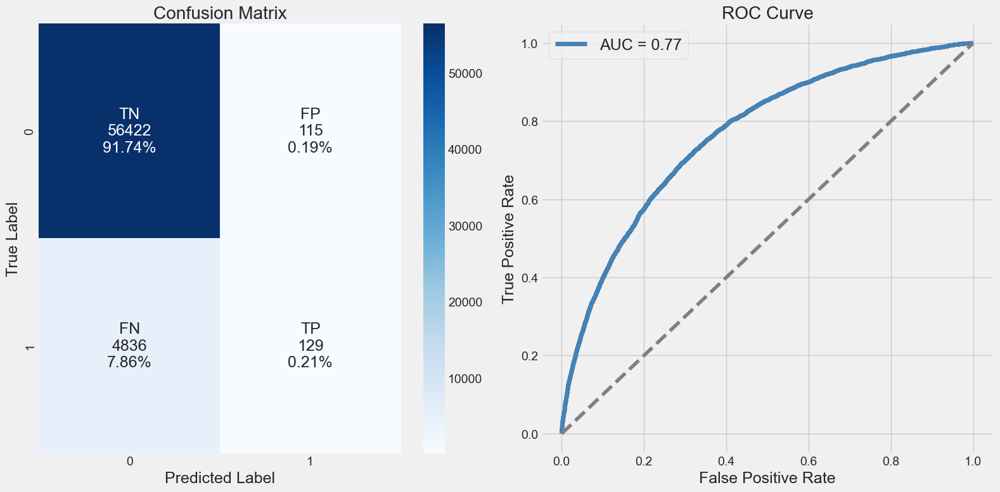

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_overs,0.92,0.53,0.03,0.05,0.77,0.7,11.513


In [60]:
model = LGBMClassifier(random_state=42)
lgbm_overs, results_lgbm_overs = mlfow_track("lgbm_overs", model,
                             X_overs, y_overs, X_test_scaled, y_test, "lgbm_overs", (16,8))

# Class weigth balanced

2023/09/21 14:10:16 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/21 14:10:31 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.96      0.73      0.83     56537
         1.0       0.18      0.69      0.29      4965

    accuracy                           0.72     61502
   macro avg       0.57      0.71      0.56     61502
weighted avg       0.90      0.72      0.78     61502



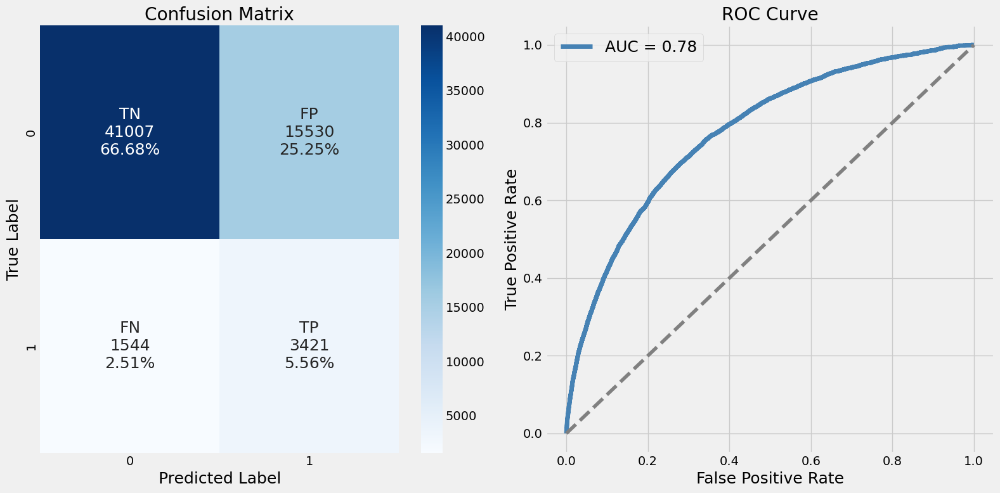

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_balanced,0.72,0.18,0.69,0.29,0.78,0.71,15.202


Successfully registered model 'lgbm_balanced'.
2023/09/21 14:10:38 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lgbm_balanced, version 1
Created version '1' of model 'lgbm_balanced'.
Registered model 'lgbm_balanced' already exists. Creating a new version of this model...
2023/09/21 14:10:39 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lgbm_balanced, version 2
Created version '2' of model 'lgbm_balanced'.


In [45]:
model = LGBMClassifier(class_weight="balanced", random_state=42)
lgbm_balanced, results_lgbm_balanced = mlfow_track("lgbm_balanced", model,
                             X_train_scaled, y_train, X_test_scaled, y_test, "lgbm_balanced", (16,8))

In [46]:
lgbm_balanced

LGBMClassifier(class_weight='balanced', random_state=42)

In [106]:
pickle_out = open("lgbm_balanced.pkl","wb")
pickle.dump(lgbm_balanced, pickle_out)
pickle_out.close()

## Comparaison des résultas LGBM

In [63]:
comp_lgbm = pd.concat([results_lgbm_origine, results_lgbm_unders, results_lgbm_overs, results_lgbm_balanced], axis=0)
comp_lgbm

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_origine,0.92,0.53,0.03,0.06,0.78,0.70,4.993
0,lgbm_unders,0.70,0.17,0.70,0.28,0.77,0.70,1.231
0,lgbm_overs,0.92,0.53,0.03,0.05,0.77,0.70,11.513
0,lgbm_balanced,0.72,0.18,0.69,0.29,0.78,0.71,4.928


# Comparaison Total

In [64]:
comp_total = pd.concat([comp_lr, comp_rf, comp_lgbm], axis=0)
comp_total.sort_values("roc_auc_score", ascending=False)

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_origine,0.92,0.53,0.03,0.06,0.78,0.70,4.993
0,lgbm_balanced,0.72,0.18,0.69,0.29,0.78,0.71,4.928
0,lgbm_unders,0.70,0.17,0.70,0.28,0.77,0.70,1.231
0,lgbm_overs,0.92,0.53,0.03,0.05,0.77,0.70,11.513
0,lr_origine,0.92,0.51,0.02,0.04,0.76,0.70,17.830
0,lr_unders,0.70,0.17,0.69,0.27,0.76,0.69,4.066
0,lr_balanced,0.70,0.17,0.69,0.27,0.76,0.70,17.184
0,lr_overs,0.71,0.17,0.65,0.26,0.75,0.69,34.034
0,rf_unders,0.69,0.16,0.68,0.26,0.75,0.69,19.670
0,rf_balanced,0.92,0.62,0.00,0.00,0.73,0.70,129.976


# Explainability

In [47]:
import shap
shap.initjs()

In [48]:
X_test_scaled.shape

(61502, 409)

# Feature Importance pour lgbm balanced

In [51]:
# Affichage des features importance
def show_feature_importance(model,  data, name):
    
    feat_imp = model.feature_importances_
    df_feat_imp = pd.DataFrame(feat_imp, columns = ["Feature Importance"])
    df_feat_imp["Feature Name"] = data.columns
    df_feat_imp = df_feat_imp.sort_values(by="Feature Importance", ascending=False)
    display(df_feat_imp.head(15))   
    # Affichage Features importance
    plt.barh(df_feat_imp.head(15)["Feature Name"], df_feat_imp.head(15)["Feature Importance"])
    plt.xlabel("Feature Importance")
    plt.title(f"Feature importance pour le modele {name} ")
    plt.show()
    return None

,Feature Importance,Feature Name
183,188,PAYMENT_RATE
23,123,EXT_SOURCE_2
24,115,EXT_SOURCE_3
8,83,DAYS_BIRTH
257,80,PREV_CNT_PAYMENT_MEAN
9,65,DAYS_EMPLOYED
393,58,INSTAL_DPD_MEAN
6,57,AMT_ANNUITY
188,48,BURO_DAYS_CREDIT_ENDDATE_MAX
380,45,POS_MONTHS_BALANCE_SIZE


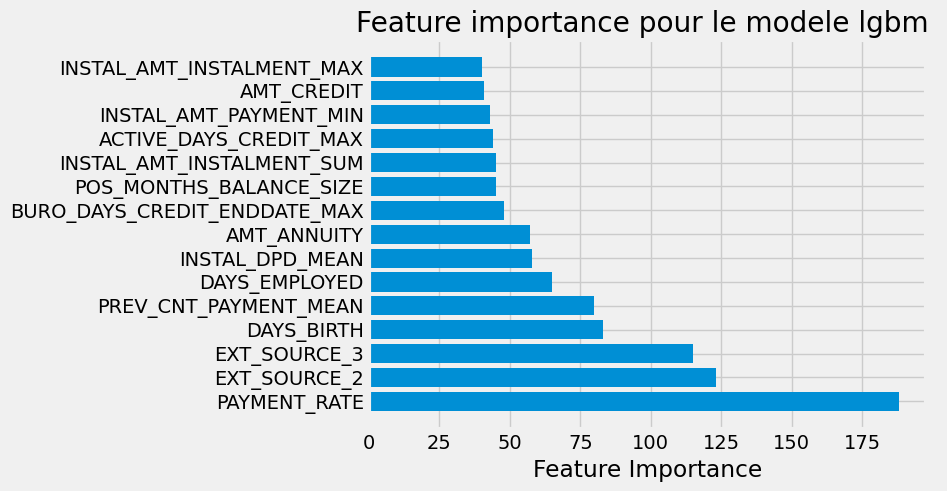

In [52]:
show_feature_importance(model,  X_test_scaled, "lgbm")

# Summary Plot

Below we have generated a summary plot with plot type as bar based on shape values generated from test data using the explainer. The bar chart shows the average impact of each feature on the final prediction. This also highlights feature importance based on shap values.
The summary plot can handle multi-class shap values. Below we have generated a summary plot of test data and it defaults to a bar chart for multi-class problems. We can see how much each attribute contributes on average for each class type.

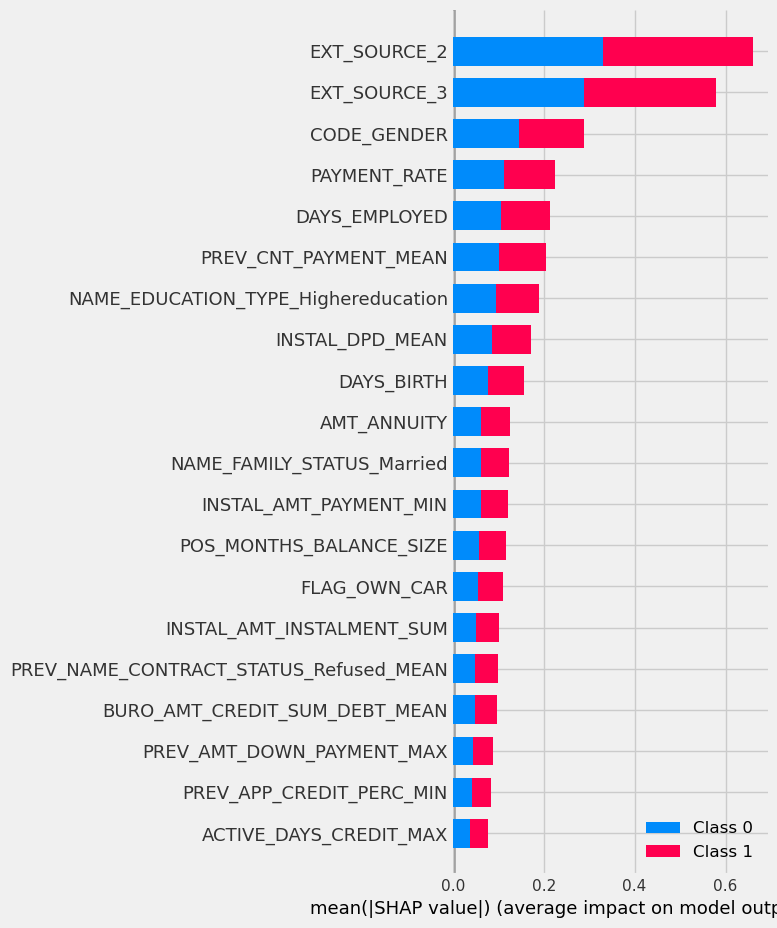

In [53]:
# Explain model predictions using shap library:
model = lgbm_balanced
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test_scaled)
# Plot summary_plot
shap.summary_plot(shap_values, X_test_scaled)

In [54]:
vals= np.abs(shap_values).mean(0)
feature_importance = pd.DataFrame(list(zip(X_test_scaled.columns, sum(vals))),
                                  columns=['col_name','feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'], ascending=False,inplace=True)
feature_importance.head(10)

,col_name,feature_importance_vals
23,EXT_SOURCE_2,20302.138369
24,EXT_SOURCE_3,17777.862458
0,CODE_GENDER,8895.684155
183,PAYMENT_RATE,6936.039532
9,DAYS_EMPLOYED,6552.505388
257,PREV_CNT_PAYMENT_MEAN,6297.880711
70,NAME_EDUCATION_TYPE_Highereducation,5828.243290
393,INSTAL_DPD_MEAN,5291.500269
8,DAYS_BIRTH,4804.153693
6,AMT_ANNUITY,3848.297470


In [55]:
cols_importance = feature_importance.head(10).col_name
cols_importance.tolist()

['EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'CODE_GENDER',
 'PAYMENT_RATE',
 'DAYS_EMPLOYED',
 'PREV_CNT_PAYMENT_MEAN',
 'NAME_EDUCATION_TYPE_Highereducation',
 'INSTAL_DPD_MEAN',
 'DAYS_BIRTH',
 'AMT_ANNUITY']

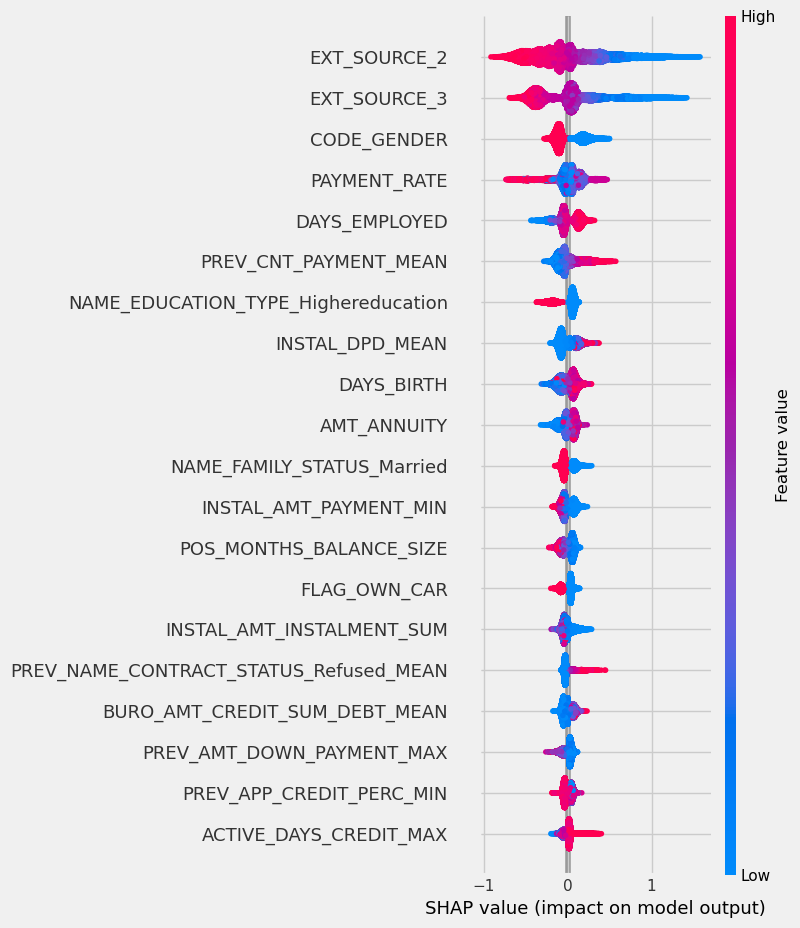

In [56]:
shap.summary_plot(shap_values[1], X_test_scaled, feature_names=X_test_scaled.columns)

100%|===================| 61496/61502 [03:12<00:00]        

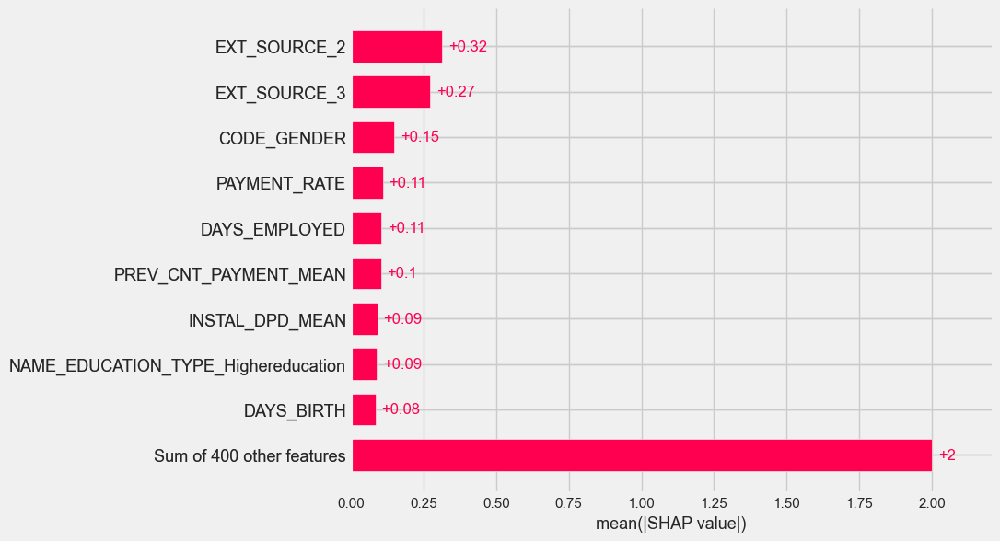

In [69]:
explainer = shap.Explainer(model, X_test_scaled)
shap_values = explainer(X_test_scaled, check_additivity=False)
shap.plots.bar(shap_values)

### Shap pour X_test_sample

In [58]:
X_test_scaled.head(1)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cashloans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Groupofpeople,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,NAME_TYPE_SUITE_Spousepartner,NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercialassociate,NAME_INCOME_TYPE_Maternityleave,NAME_INCOME_TYPE_Stateservant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academicdegree,NAME_EDUCATION_TYPE_Highereducation,NAME_EDUCATION_TYPE_Incompletehigher,NAME_EDUCATION_TYPE_Lowersecondary,NAME_FAMILY_STATUS_Civilmarriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Singlenotmarried,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Coopapartment,NAME_HOUSING_TYPE_Houseapartment,NAME_HOUSING_TYPE_Municipalapartment,NAME_HOUSING_TYPE_Officeapartment,NAME_HOUSING_TYPE_Rentedapartment,NAME_HOUSING_TYPE_Withparents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaningstaff,OCCUPATION_TYPE_Cookingstaff,OCCUPATION_TYPE_Corestaff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HRstaff,OCCUPATION_TYPE_Highskilltechstaff,OCCUPATION_TYPE_ITstaff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_LowskillLaborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicinestaff,OCCUPATION_TYPE_Privateservicestaff,OCCUPATION_TYPE_Realtyagents,OCCUPATION_TYPE_Salesstaff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Securitystaff,OCCUPATION_TYPE_Waitersbarmenstaff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_BusinessEntityType1,ORGANIZATION_TYPE_BusinessEntityType2,ORGANIZATION_TYPE_BusinessEntityType3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industrytype1,ORGANIZATION_TYPE_Industrytype10,ORGANIZATION_TYPE_Industrytype11,ORGANIZATION_TYPE_Industrytype12,ORGANIZATION_TYPE_Industrytype13,ORGANIZATION_TYPE_Industrytype2,ORGANIZATION_TYPE_Industrytype3,ORGANIZATION_TYPE_Industrytype4,ORGANIZATION_TYPE_Industrytype5,ORGANIZATION_TYPE_Industrytype6,ORGANIZATION_TYPE_Industrytype7,ORGANIZATION_TYPE_Industrytype8,ORGANIZATION_TYPE_Industrytype9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_LegalServices,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_SecurityMinistries,ORGANIZATION_TYPE_Selfemployed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom

In [59]:
#X_test_sample = X_test_scaled.sample(10, random_state=42)
X_test_sample = X_test_scaled.head(1)
X_test_sample.shape

(1, 409)

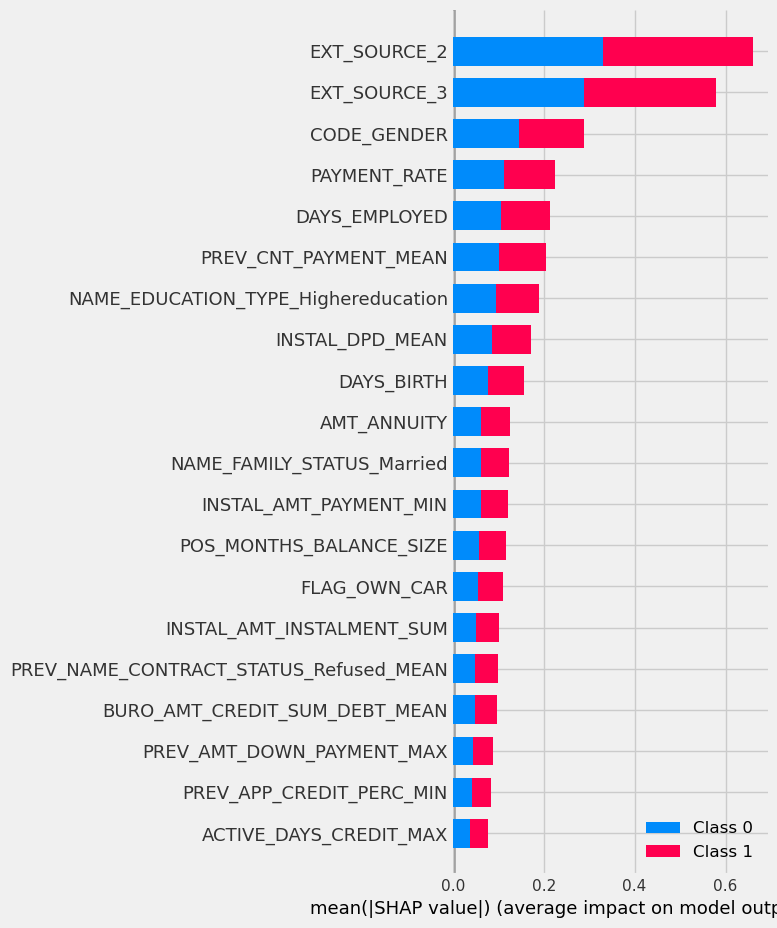

In [60]:
shap.summary_plot(shap_values, X_test_sample, feature_names=X_test_sample.columns)

In [62]:
model = lgbm_balanced
#X_test_sample = X_test_scaled.sample(10, random_state=42)
subsampled_test_data =X_test_sample

# explain first sample from test data
start_time = time.time()
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(subsampled_test_data)
elapsed_time = time.time() - start_time

print("Tree Explainer SHAP run time", round(elapsed_time,3) , " seconds. ", "lgbm_balanced")
print("SHAP expected value", explainer.expected_value)
print("Model prediction for subsampled_test_data", model.predict_proba(subsampled_test_data))
shap.initjs()
pred_ind = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][0], subsampled_test_data.iloc[0], 
                feature_names=X_train_scaled.columns)

Tree Explainer SHAP run time 0.067  seconds.  lgbm_balanced
SHAP expected value [0.5337230246070896, -0.5337230246070896]
Model mean value [0.60762704 0.39237296]
Model prediction for subsampled_test_data [[0.4415404 0.5584596]]


# Model2

In [66]:
cols_importance 

23                            EXT_SOURCE_2
24                            EXT_SOURCE_3
0                              CODE_GENDER
183                           PAYMENT_RATE
9                            DAYS_EMPLOYED
257                  PREV_CNT_PAYMENT_MEAN
70     NAME_EDUCATION_TYPE_Highereducation
393                        INSTAL_DPD_MEAN
8                               DAYS_BIRTH
6                              AMT_ANNUITY
Name: col_name, dtype: object

In [67]:
X_train_imp = X_train_scaled[cols_importance]
X_test_imp = X_test_scaled[cols_importance]
X_test_imp.shape

(61502, 10)

# Class weigth balanced

              precision    recall  f1-score   support

         0.0       0.96      0.73      0.83     56537
         1.0       0.18      0.69      0.29      4965

    accuracy                           0.72     61502
   macro avg       0.57      0.71      0.56     61502
weighted avg       0.90      0.72      0.78     61502



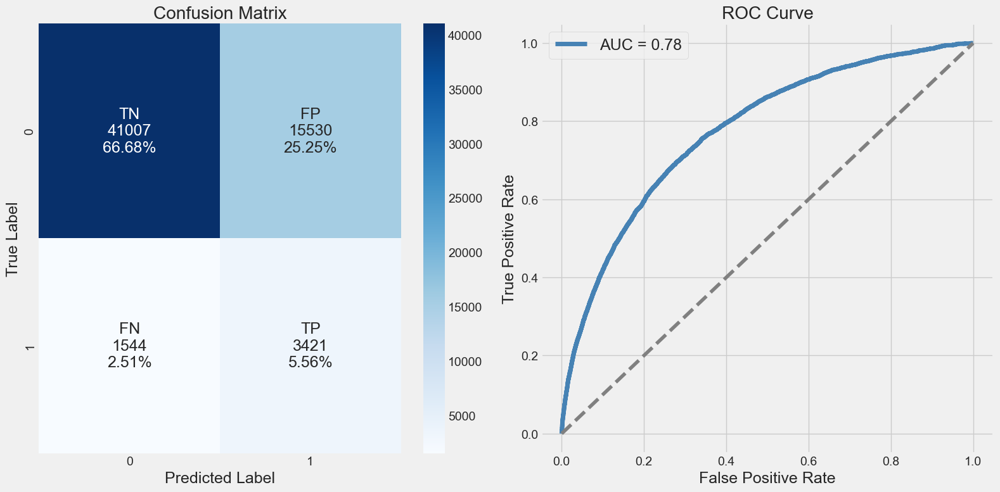

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_balanced,0.72,0.18,0.69,0.29,0.78,0.71,4.779


In [33]:
model = LGBMClassifier(class_weight="balanced", random_state=42)
lgbm_balanced, results_lgbm_balanced = mlfow_track("lgbm_balanced", model,
                             X_train_scaled, y_train, X_test_scaled, y_test, "lgbm_balanced", (16,8))

# Class weigth balanced

2023/09/21 14:29:32 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/21 14:29:34 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.96      0.70      0.81     56537
         1.0       0.17      0.69      0.27      4965

    accuracy                           0.70     61502
   macro avg       0.56      0.69      0.54     61502
weighted avg       0.90      0.70      0.76     61502



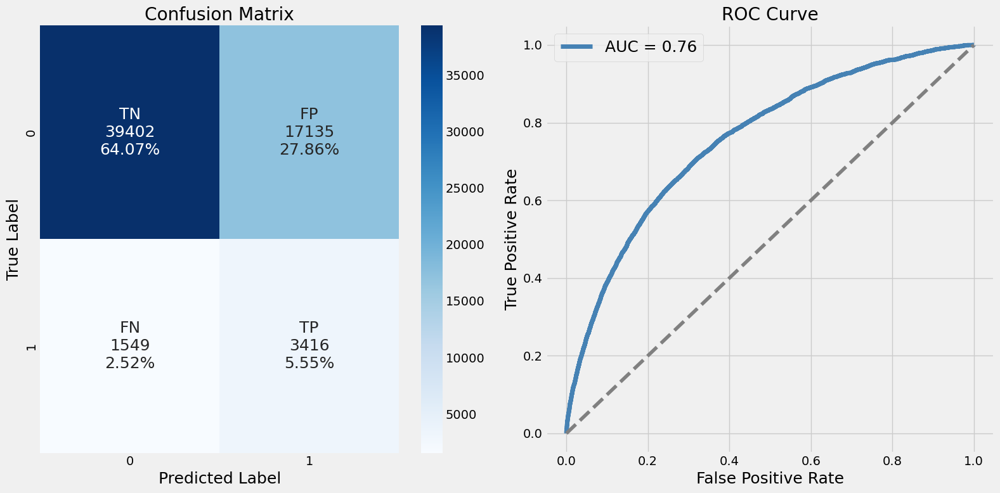

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_imp,0.7,0.17,0.69,0.27,0.76,0.69,1.732


Successfully registered model 'lgbm_imp'.
2023/09/21 14:29:36 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lgbm_imp, version 1
Created version '1' of model 'lgbm_imp'.
Registered model 'lgbm_imp' already exists. Creating a new version of this model...
2023/09/21 14:29:37 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lgbm_imp, version 2
Created version '2' of model 'lgbm_imp'.


In [68]:
model = LGBMClassifier(class_weight="balanced", random_state=42)
lgbm_imp, results_lgbm_imp = mlfow_track("lgbm_imp", model,
                             X_train_imp, y_train, X_test_imp, y_test, "lgbm_imp", (16,8))

In [69]:
results_lgbm_balanced

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_balanced,0.72,0.18,0.69,0.29,0.78,0.71,15.202


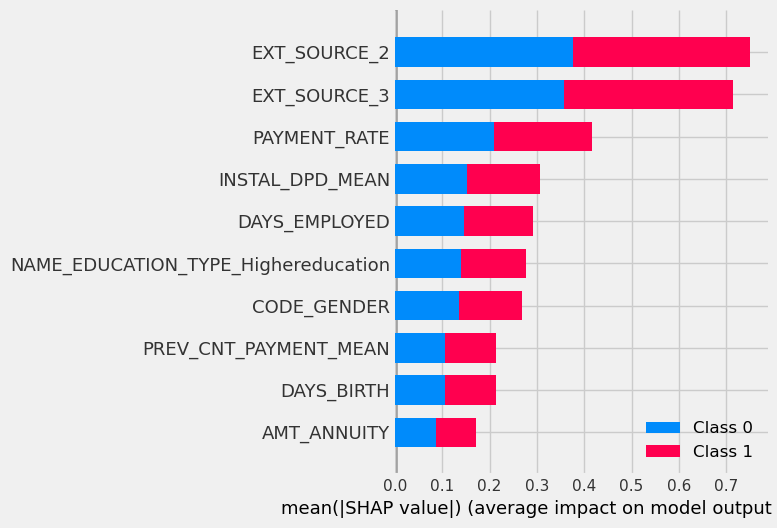

In [72]:
# Explain model predictions using shap library:
model = lgbm_imp
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test_imp)
# Plot summary_plot
shap.summary_plot(shap_values, X_test_imp)

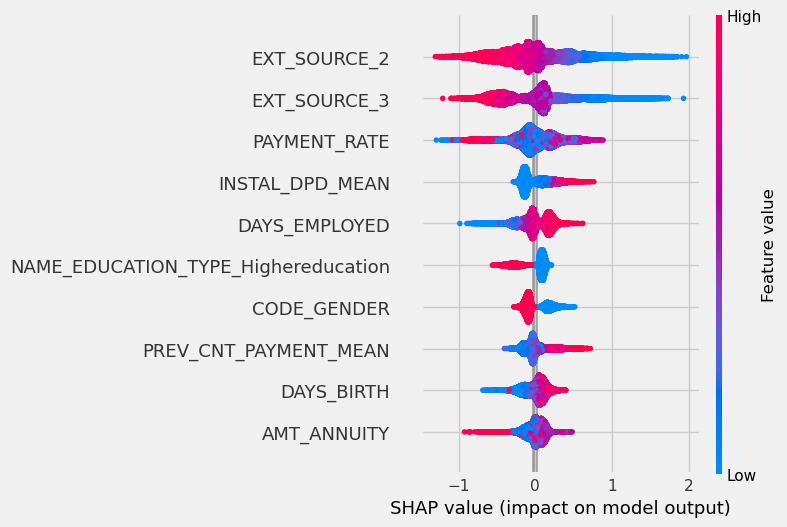

In [73]:
shap.summary_plot(shap_values[1], X_test_imp, feature_names=X_test_imp.columns)

In [75]:
X_test_sample2 = X_test_imp.head(1)
X_test_sample2

,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,PAYMENT_RATE,DAYS_EMPLOYED,PREV_CNT_PAYMENT_MEAN,NAME_EDUCATION_TYPE_Highereducation,INSTAL_DPD_MEAN,DAYS_BIRTH,AMT_ANNUITY
SK_ID_CURR,,,,,,,,,,
343913.0,0.030432,0.110796,0.720924,-0.241825,0.283392,-0.290348,1.76257,-0.052079,-0.991486,0.644464


### Shap pour X_test_sample2

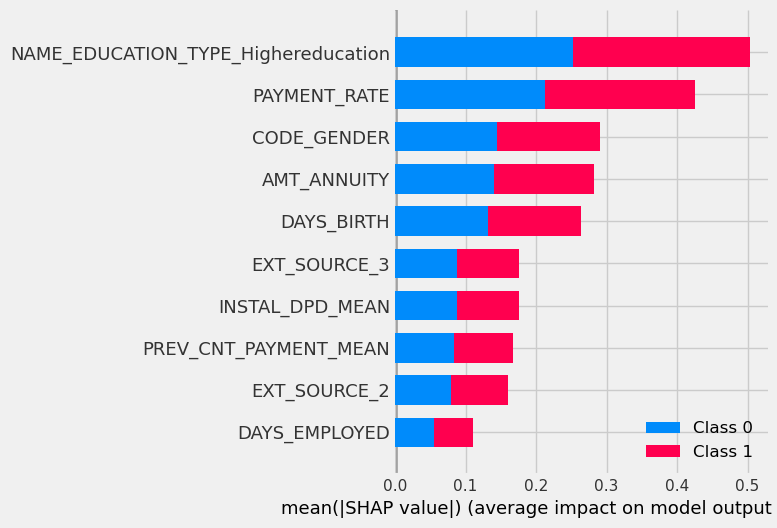

In [77]:
# Explain model predictions using shap library:
model = lgbm_imp
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test_sample2)
# Plot summary_plot
shap.summary_plot(shap_values, X_test_sample2)

In [80]:
model = lgbm_imp
subsampled_test_data =X_test_sample2

# explain first sample from test data
start_time = time.time()
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(subsampled_test_data)
elapsed_time = time.time() - start_time

print("Tree Explainer SHAP run time", round(elapsed_time,3) , " seconds. ", "lgbm_balanced")
print("SHAP expected value", explainer.expected_value)
print("Model prediction for test data", model.predict_proba(subsampled_test_data))
shap.initjs()
pred_ind = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][0], subsampled_test_data.iloc[0], 
                feature_names=X_test_sample2.columns)

Tree Explainer SHAP run time 0.067  seconds.  lgbm_balanced
SHAP expected value [0.43666198693277447, -0.43666198693277447]
Model prediction for test data [[0.62139753 0.37860247]]


In [108]:
pickle_out = open("lgbm_imp.pkl","wb")
pickle.dump(lgbm_imp, pickle_out)
pickle_out.close()

In [120]:
X_test_imp = X_test_imp.reset_index()
X_test_imp.SK_ID_CURR = X_test_imp.SK_ID_CURR.astype(int)
X_test_imp.head(3)

,SK_ID_CURR,EXT_SOURCE_2,EXT_SOURCE_3,CODE_GENDER,PAYMENT_RATE,DAYS_EMPLOYED,PREV_CNT_PAYMENT_MEAN,NAME_EDUCATION_TYPE_Highereducation,INSTAL_DPD_MEAN,DAYS_BIRTH,AMT_ANNUITY
0,343913,0.030432,0.110796,0.720924,-0.241825,0.283392,-0.290348,1.762570,-0.052079,-0.991486,0.644464
1,281768,0.360032,0.885532,0.720924,-1.082975,0.344982,1.175612,-0.567353,-0.110736,0.979593,0.320462
2,215345,-0.158853,0.110796,0.720924,0.582748,0.802701,-0.290348,-0.567353,0.079899,0.958746,-0.496384


In [121]:
# data_test_imp = X_test_imp.to_csv("data_test_imp.csv", index=False)

In [128]:
data_test_imp = X_test_imp.copy()
data_test_imp.shape

(61502, 11)

In [137]:
app_train = pd.read_csv("data_p7/application_train.csv")
app_train.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [140]:
# Assuming df1 and df2 are your dataframes with ID columns
matching_ids = data_test_imp['SK_ID_CURR'].tolist()
filtered_data = app_train[app_train['SK_ID_CURR'].isin(matching_ids)]
filtered_data.shape

(61502, 122)

In [141]:
filtered_data.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
5,100008,0,Cash loans,M,N,Y,0,99000.000,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,-1588,-4970.0,-477,NaN,1,1,1,1,1,0,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,NaN,0.354225,0.621226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-2536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
11,100015,0,Cash loans,F,N,Y,0,38419.155,148365.0,10678.5,135000.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.015221,-20417,365243,-5246.0,-2512,NaN,1,0,0,1,1,0,NaN,2.0,2,2,FRIDAY,7,0,0,0,0,0,0,XNA,0.722044,0.555183,0.652897,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-2396.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


In [142]:
#filtered_data.to_csv("filtered_data.csv", index=False)

# Gridsearch Model hyperparametre Tuning

In [83]:
params = {'n_estimators' : [100, 300, 500, 800],
          'max_depth': [-1, 2, 5, 7],
          'num_leaves': [7, 15, 31, 63, 127],
          'learning_rate': [0.05, 0.1, 0.2, 0.4]
         }

mlflow.lightgbm.autolog()
with mlflow.start_run(run_name='Grid_lgbm'):
    model = LGBMClassifier(class_weight="balanced", random_state=42)
    grid_lgbm_2 = GridSearchCV(
        model,
        param_grid=params,
        cv=5,
        scoring="roc_auc",
        return_train_score=True)
    
    grid_lgbm_2.fit(X_train_imp, y_train)

KeyboardInterrupt: 

In [133]:
result_lgbm_2 = pd.DataFrame(grid_lgbm_2.cv_results_)
result_lgbm_2.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,12.031619,0.877255,0.375258,0.106353,0.05,-1,100,7,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-1.200655,-1.174723,-1.277316,-1.226586,-1.211229,-1.218102,0.034093,261,-1.169751,-1.162229,-1.149610,-1.169247,-1.162261,-1.162620,0.007271
1,14.671362,2.116352,0.358326,0.118312,0.05,-1,100,15,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-1.190206,-1.156219,-1.230488,-1.189829,-1.170443,-1.187437,0.025021,227,-1.052304,-1.057370,-1.053751,-1.065206,-1.061524,-1.058031,0.004801
2,18.680236,2.062486,0.486828,0.090432,0.05,-1,100,31,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-1.144386,-1.122356,-1.185549,-1.142372,-1.149169,-1.148766,0.020546,112,-0.898792,-0.895739,-0.888532,-0.894197,-0.888564,-0.893165,0.004049
3,31.930273,0.645387,0.491998,0.025638,0.05,-1,100,63,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-1.155841,-1.140987,-1.168051,-1.155841,-1.172331,-1.158610,0.010985,149,-0.644165,-0.645361,-0.624811,-0.636203,-0.622168,-0.634542,0.009594
4,42.330612,3.563008,0.687780,0.153748,0.05,-1,100,127,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-1.167170,-1.136959,-1.188444,-1.166667,-1.155463,-1.162941,0.016812,178,-0.221897,-0.226240,-0.227058,-0.205092,-0.225516,-0.221161,0.008226


In [134]:
print('Meilleurs paramètres',grid_lgbm_2.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_lgbm_2.loc[result_lgbm_fin['params']==grid_lgbm_2.best_params_])

Meilleurs paramètres {'learning_rate': 0.05, 'max_depth': -1, 'n_estimators': 500, 'num_leaves': 31}
Résultats des meilleurs paramètres :



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
12,17.618641,2.344639,0.362367,0.020528,0.05,-1,500,31,"{'learning_rate': 0.05, 'max_depth': -1, 'n_es...",-1.103726,-1.082326,-1.18215,-1.115433,-1.097054,-1.116138,0.034697,1,-0.189105,-0.198011,-0.198137,-0.187531,-0.196626,-0.193882,0.004601


2023/09/21 17:30:12 INFO mlflow.tracking.fluent: Experiment with name 'lgbm_imp_grid' does not exist. Creating a new experiment.
2023/09/21 17:30:13 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5
2023/09/21 17:30:16 WARNING mlflow.sklearn: Failed to infer model signature: could not sample data to infer model signature: 5


              precision    recall  f1-score   support

         0.0       0.96      0.70      0.81     56537
         1.0       0.17      0.69      0.27      4965

    accuracy                           0.70     61502
   macro avg       0.56      0.69      0.54     61502
weighted avg       0.90      0.70      0.76     61502



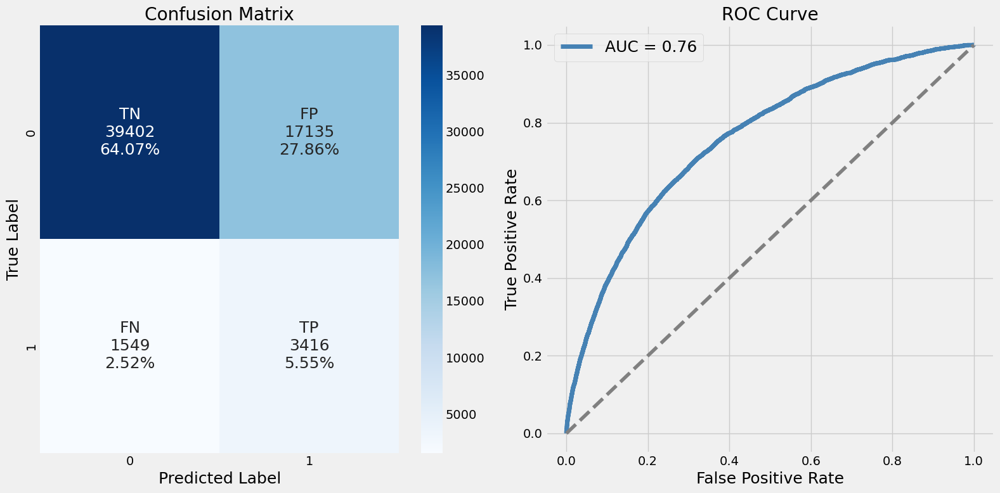

,model,accuracy,precision,recall,f1_score,roc_auc_score,custom_score,execution_time
0,lgbm_imp_grid,0.7,0.17,0.69,0.27,0.76,0.69,2.11


Successfully registered model 'lgbm_imp_grid'.
2023/09/21 17:30:19 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lgbm_imp_grid, version 1
Created version '1' of model 'lgbm_imp_grid'.
Registered model 'lgbm_imp_grid' already exists. Creating a new version of this model...
2023/09/21 17:30:20 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: lgbm_imp_grid, version 2
Created version '2' of model 'lgbm_imp_grid'.


In [81]:
model = LGBMClassifier(class_weight="balanced", random_state=42)

params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.05]
}

lgbm_grid = GridSearchCV(
    model,
    param_grid=params,
    scoring="roc_auc",
    cv=5, 
    return_train_score = True,
)


lgbm_imp_grid, results_lgbm_imp_grid = mlfow_track("lgbm_imp_grid", model,
                             X_train_imp, y_train, X_test_imp, y_test, "lgbm_imp_grid", (16,8))

# Data drift

In [47]:
from evidently.report import Report
from evidently.metrics import DataDriftTable, DatasetDriftMetric

In [48]:
drift_train = pd.read_csv(path + 'data_p7/application_train.csv')
drift_test = pd.read_csv(path + 'data_p7/application_test.csv')

In [49]:
drift_train.drop("TARGET", axis=1, inplace=True)

In [50]:
#data_drift_report = Report(metrics=[DatasetDriftMetric(), DataDriftTable()])
#data_drift_report.run(reference_data=drift_train, current_data=drift_test)

In [81]:
#data_drift_report.show(mode='inline')

In [51]:
#data_drift_report.save_html('data_drift_report.html')  